In [1]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image
from tqdm import trange

In [2]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
device

device(type='mps')

In [3]:
vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1).features.to(device).eval()
for p in vgg.parameters():
  p.requires_grad_(False)
vgg

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

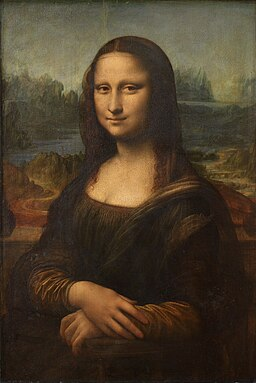

In [4]:
img = Image.open("inp/mona_lisa.jpg")
display(img)

In [5]:
preprocess = transforms.Compose([
  transforms.Resize(224),
  transforms.ToTensor(),
  transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225],
  ),
])

base = preprocess(img).unsqueeze(0).to(device)

mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
std = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)

reg_fn = lambda x, lmbda=1e-4, gamma=1e-5: lmbda * x.pow(2).mean() + gamma * (x[..., 1:] - x[..., :-1]).abs().mean()

def to_img(x):
  x = (x * std + mean).clamp(0, 1)
  return x[0].detach().cpu().permute(1, 2, 0).numpy()

def clamp_(x):
  x.data.clamp_((0 - mean) / std, (1 - mean) / std)

def hook_layer(layer_idx):
  acts = {}
  h = vgg[layer_idx].register_forward_hook(
    lambda m, i, o: acts.__setitem__("v", o)
  )
  return acts, h

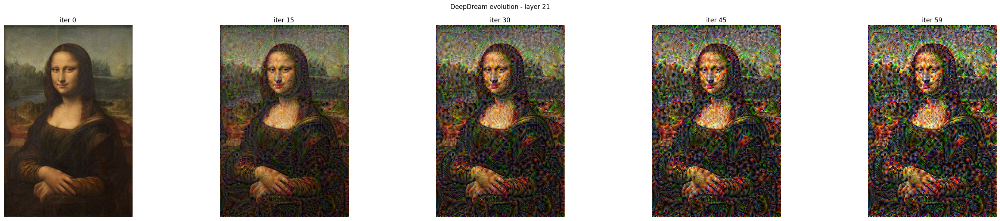

In [6]:
layer = 21
steps = 60

acts, h = hook_layer(layer)
x = base.clone().requires_grad_(True)
opt = torch.optim.Adam([x], lr=0.05)

hist = []
for i in range(steps):
  opt.zero_grad()
  vgg(x)
  a = acts["v"]
  reg = reg_fn(x)
  loss = -a.mean() + reg
  loss.backward()
  opt.step()
  clamp_(x)

  if i % 15 == 0 or i == steps - 1:
    hist.append({"i": i, "act": float(a.detach().mean()), "img": to_img(x)})

h.remove()

fig, axes = plt.subplots(1, len(hist), figsize=(6 * len(hist), 6))
for ax, h_ in zip(axes, hist):
  ax.imshow(h_["img"])
  ax.set_title(f"iter {h_['i']}")
  ax.axis("off")
fig.suptitle(f"DeepDream evolution - layer {layer}")
plt.tight_layout()
plt.show()

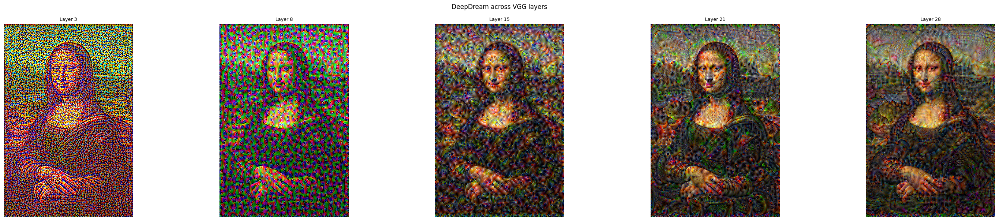

In [7]:
def deepdream_once(x, layer_idx, steps=50, lr=0.05):
  acts, h = hook_layer(layer_idx)
  x = x.clone().requires_grad_(True)
  opt = torch.optim.Adam([x], lr=lr)

  for _ in range(steps):
    opt.zero_grad()
    vgg(x)
    a = acts["v"]
    reg = reg_fn(x)
    loss = -a.mean() + reg
    loss.backward()
    opt.step()
    clamp_(x)

  h.remove()
  return to_img(x), float(a.detach().mean())

layers = [3, 8, 15, 21, 28]

fig, axes = plt.subplots(1, len(layers), figsize=(6 * len(layers), 6))
for ax, l in zip(axes, layers):
  img_l, _ = deepdream_once(base, l, steps=50, lr=0.05)
  ax.imshow(img_l)
  ax.set_title(f"Layer {l}", fontsize=9)
  ax.axis("off")

fig.suptitle("DeepDream across VGG layers")
plt.tight_layout()
plt.show()

/var/folders/jl/3j7tmh8n5rzg4_yfm7vlg3gr0000gn/T/ipykernel_16474/442185057.py:18: UserWarning: Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:837.)
  acts_hist.append(float(a.mean()))


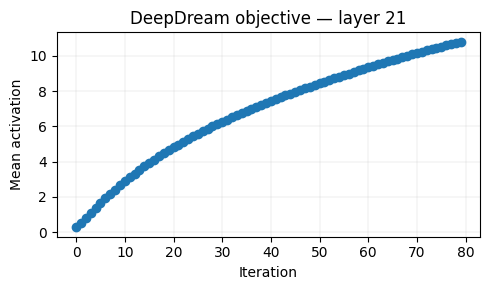

In [8]:
layer = 21
steps = 80

acts, h = hook_layer(layer)
x = base.clone().requires_grad_(True)
opt = torch.optim.Adam([x], lr=0.05)

acts_hist = []
for _ in range(steps):
  opt.zero_grad()
  vgg(x)
  a = acts["v"]
  reg = reg_fn(x)
  loss = -a.mean() + reg
  loss.backward()
  opt.step()
  clamp_(x)
  acts_hist.append(float(a.mean()))

h.remove()

plt.figure(figsize=(5, 3))
plt.plot(acts_hist, marker="o")
plt.xlabel("Iteration")
plt.ylabel("Mean activation")
plt.title(f"DeepDream objective — layer {layer}")
plt.grid(True, linewidth=0.3, alpha=0.5)
plt.tight_layout()
plt.show()

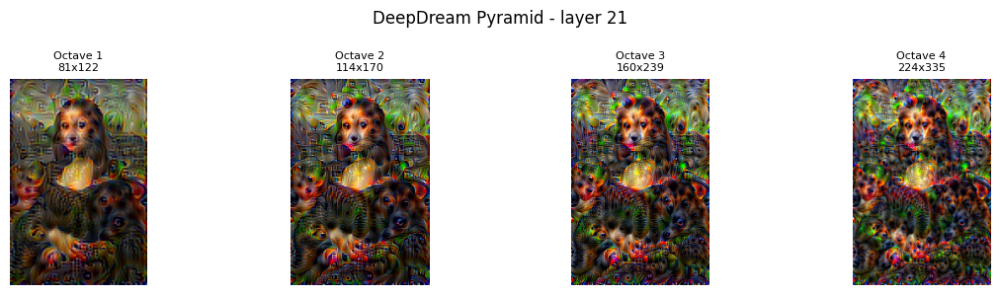

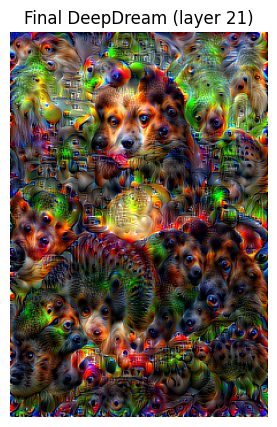

In [9]:
def deepdream_pyramid(x0, layer_idx, octaves=4, scale=1.4, steps=25, lr=0.05):
  acts, h = hook_layer(layer_idx)

  x = x0.clone()
  _, _, H, W = x.shape
  sizes = [(max(16, int(H * scale ** (o - octaves + 1))), max(16, int(W * scale ** (o - octaves + 1)))) for o in range(octaves)]

  imgs = []
  for h_size, w_size in sizes:
    x = F.interpolate(x, (h_size, w_size), mode="bilinear", align_corners=True)
    x = x.detach().requires_grad_(True)
    opt = torch.optim.Adam([x], lr=lr)

    for _ in range(steps):
      opt.zero_grad()
      vgg(x)
      a = acts["v"]
      reg = reg_fn(x)
      loss = -a.mean() + reg
      loss.backward()
      opt.step()
      clamp_(x)

    imgs.append(to_img(x))

  h.remove()
  return imgs, sizes

layer = 21
octaves = 4

imgs, sizes = deepdream_pyramid(base, layer_idx=layer, octaves=octaves, scale=1.4, steps=25, lr=0.05)

fig, axes = plt.subplots(1, octaves, figsize=(3 * octaves, 3))
for i, (ax, im) in enumerate(zip(axes, imgs)):
  h_size, w_size = sizes[i]
  ax.imshow(im)
  ax.set_title(f"Octave {i+1}\n{w_size}x{h_size}", fontsize=8)
  ax.axis("off")
fig.suptitle(f"DeepDream Pyramid - layer {layer}")
plt.tight_layout()
plt.show()

plt.figure(figsize=(5, 5))
plt.imshow(imgs[-1])
plt.axis("off")
plt.title(f"Final DeepDream (layer {layer})")
plt.show()


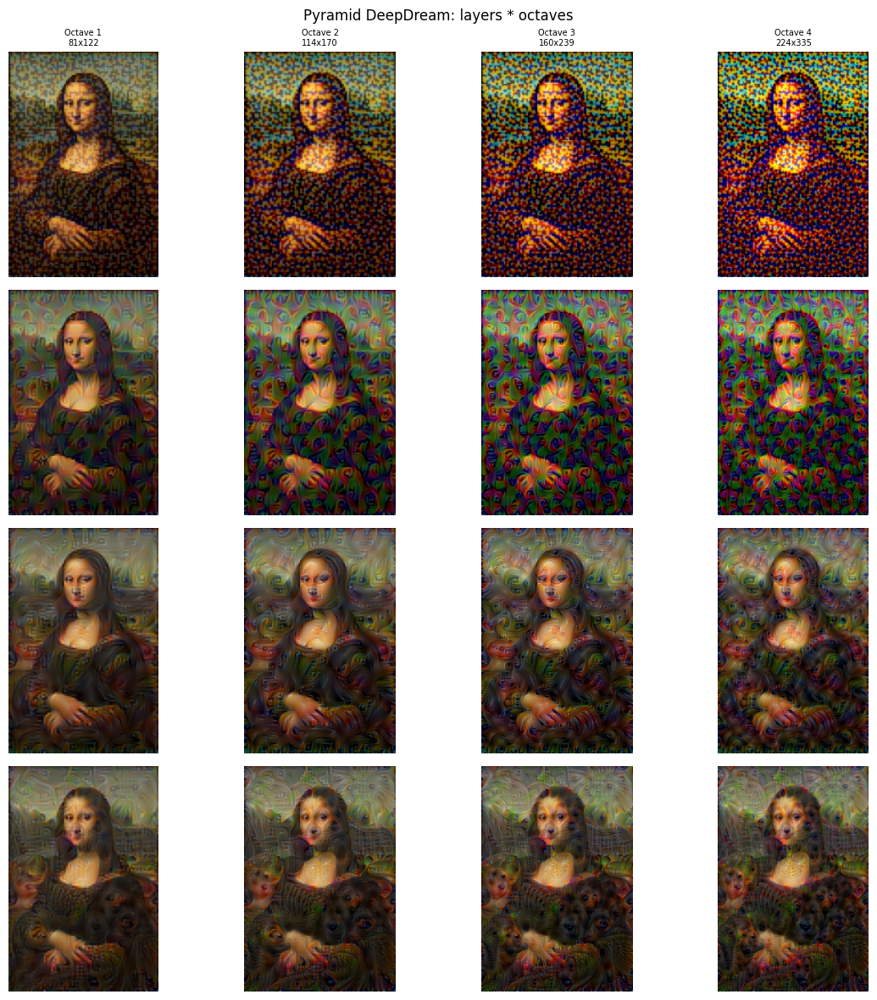

In [10]:
layers = [3, 8, 15, 21]
octaves = 4

all_imgs = []
for l in layers:
  imgs_l, sizes_l = deepdream_pyramid(base, layer_idx=l, octaves=octaves, scale=1.4, steps=12, lr=0.03)
  all_imgs.append((l, imgs_l, sizes_l))

plt.figure(figsize=(3 * octaves, 3 * len(layers)))
for row, (l, imgs_l, sizes_l) in enumerate(all_imgs):
  for col, (im, (h_size, w_size)) in enumerate(zip(imgs_l, sizes_l)):
    idx = row * octaves + col + 1
    plt.subplot(len(layers), octaves, idx)
    plt.imshow(im)
    if row == 0:
      plt.title(f"Octave {col+1}\n{w_size}x{h_size}", fontsize=7)
    if col == 0:
      plt.ylabel(f"Layer {l}", fontsize=8)
    plt.axis("off")

plt.suptitle("Pyramid DeepDream: layers * octaves")
plt.tight_layout()
plt.show()

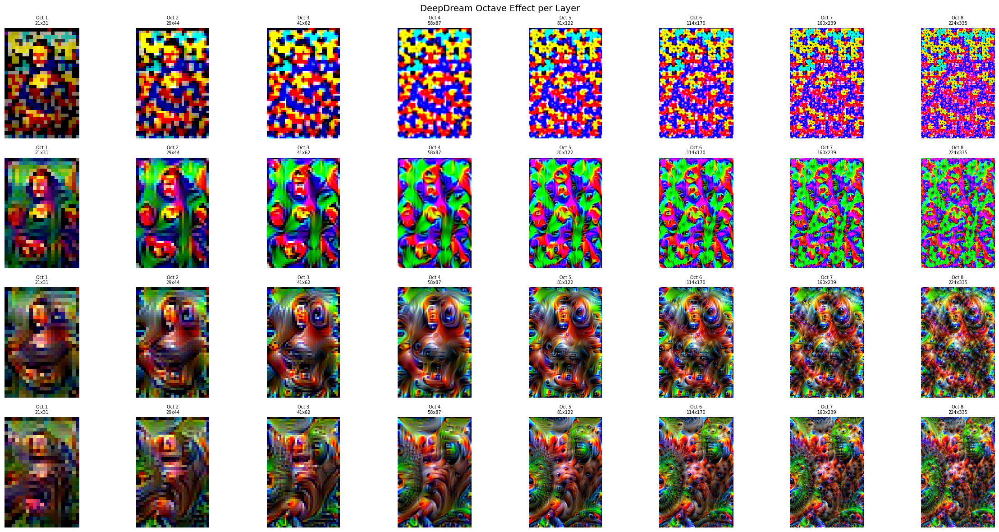

In [11]:
layers = [3, 8, 15, 21]
octaves = 8

fig, axes = plt.subplots(len(layers), octaves, figsize=(3 * octaves, 3 * len(layers)))

for r, layer in enumerate(layers):
  base = preprocess(img).unsqueeze(0).to(device)
  imgs, sizes = deepdream_pyramid(base, layer_idx=layer, octaves=octaves, scale=1.4, steps=25, lr=0.05)
  for c in range(octaves):
    ax = axes[r, c] if len(layers) > 1 else axes[c]
    ax.imshow(imgs[c])
    h, w = sizes[c]
    ax.set_title(f"Oct {c+1}\n{w}x{h}", fontsize=7)
    ax.axis("off")
  axes[r, 0].set_ylabel(f"Layer {layer}", fontsize=10, rotation=0, labelpad=30, weight='bold')

plt.suptitle("DeepDream Octave Effect per Layer", fontsize=14)
plt.tight_layout()
plt.show()

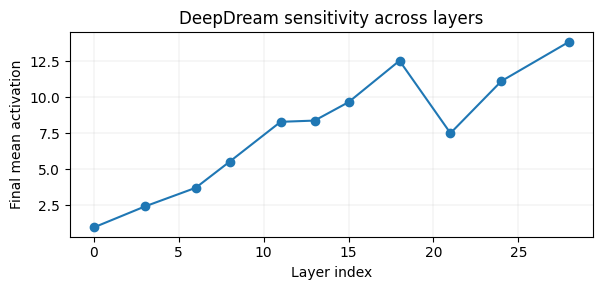

[(0, 0.9507558345794678),
 (3, 2.4054203033447266),
 (6, 3.7049801349639893),
 (8, 5.522289276123047),
 (11, 8.289618492126465),
 (13, 8.374773025512695),
 (15, 9.655477523803711),
 (18, 12.535833358764648),
 (21, 7.500472068786621),
 (24, 11.118579864501953),
 (28, 13.861559867858887)]

In [12]:
layers = [0, 3, 6, 8, 11, 13, 15, 18, 21, 24, 28]
vals = []

for l in layers:
  img_l, act_l = deepdream_once(base, l, steps=50, lr=0.04)
  vals.append(act_l)

plt.figure(figsize=(6, 3))
plt.plot(layers, vals, marker="o")
plt.xlabel("Layer index")
plt.ylabel("Final mean activation")
plt.title("DeepDream sensitivity across layers")
plt.grid(True, linewidth=0.3, alpha=0.5)
plt.tight_layout()
plt.show()

list(zip(layers, vals))

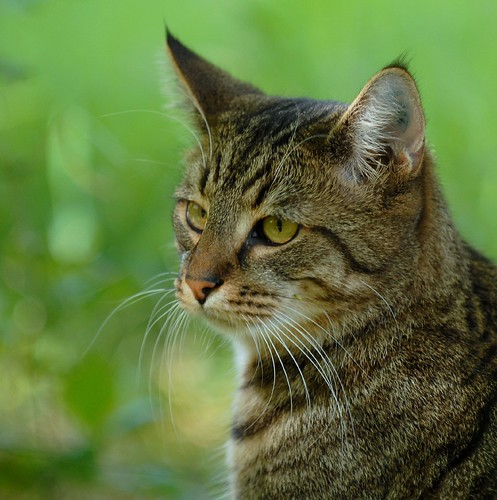

In [13]:
img = Image.open("inp/cat.jpg")
display(img)

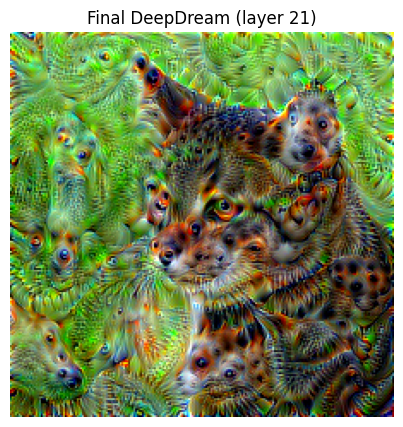

In [14]:
layer = 21
octaves = 2

base = preprocess(img).unsqueeze(0).to(device)
imgs, sizes = deepdream_pyramid(base, layer_idx=layer, octaves=octaves, scale=1.4, steps=25, lr=0.05)

plt.figure(figsize=(5, 5))
plt.imshow(imgs[-1])
plt.axis("off")
plt.title(f"Final DeepDream (layer {layer})")
plt.show()